# VAE Visualization & Unsupervised Defect Detection
This notebook loads the best VAE checkpoint and provides visualizations to support unsupervised defect detection on atom-centered patches.

What you’ll see:
- Load the trained VAE and dataset
- Reconstruction vs input grids for quick sanity checks
- Reconstruction error histogram with anomaly threshold (quantile)
- Top-K anomalous patches with highest errors
- Latent space embedding (t-SNE if available, else PCA) colored by error
- Spatial map: anomalies overlaid on original image coordinates

In [1]:
# Imports and setup
import os
from pathlib import Path
import math
import numpy as np
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from tqdm import tqdm

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

# Project imports
from livae.model import VAE
from livae.utils import load_image_from_h5, clean_state_dict
from livae.data import AdaptiveLatticeDataset

%matplotlib widget

In [2]:
# Reproducibility
torch.manual_seed(42)
np.random.seed(42)

# Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [3]:
# Load checkpoint and instantiate model with matching args
ckpt_path = Path('../checkpoints/vae_best.pt')
assert ckpt_path.exists(), f"Checkpoint not found: {ckpt_path}"

ckpt = torch.load(ckpt_path, map_location='cpu', weights_only=False)
ckpt_args = ckpt.get('args', {})

latent_dim = ckpt_args.get('latent_dim', 16)
patch_size = ckpt_args.get('patch_size', 128)
print(f"Checkpoint args: latent_dim={latent_dim}, patch_size={patch_size}")

model = VAE(latent_dim=latent_dim, in_channels=1, patch_size=patch_size).to(device)
model.load_state_dict(clean_state_dict(ckpt['model_state']))
model.eval()
model

Checkpoint args: latent_dim=16, patch_size=128


VAE(
  (encoder): VAEEncoder(
    (conv_layers): Sequential(
      (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): ReLU()
      (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): ReLU()
      (4): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (5): ReLU()
      (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (7): ReLU()
    )
    (fc_mu): Linear(in_features=16384, out_features=16, bias=True)
    (fc_logvar): Linear(in_features=16384, out_features=16, bias=True)
  )
  (decoder): VAEDecoder(
    (fc): Linear(in_features=16, out_features=16384, bias=True)
    (deconv_layers): Sequential(
      (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): ReLU()
      (2): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (3): ReLU()
      (4): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), paddin

In [4]:
# Build dataset and dataloader (no augmentation for evaluation)
data_dir = Path('../data')
h5_paths = sorted([str(p) for p in data_dir.glob('*.h5')])
assert len(h5_paths) > 0, "No H5 files found in ./data"

images = [load_image_from_h5(p) for p in h5_paths]

# Use the same dataset class as training for consistent patching
dataset = AdaptiveLatticeDataset(
    images, patch_size=patch_size, padding=16, transform=None
)

# Lighter batch size for notebook inference
batch_size = 256 if torch.cuda.is_available() else 64
loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=0)

len(dataset), batch_size

Adaptive lattice: 6395 unique sites - 4970 with atoms, 1425 empty sites
Adaptive lattice: 6446 unique sites - 5220 with atoms, 1226 empty sites
Adaptive lattice: 5995 unique sites - 4539 with atoms, 1456 empty sites


(18836, 64)

In [5]:
# Helper: iterate dataset to compute reconstructions, latents, and errors
@torch.no_grad()
def collect_stats(model, loader):
    model.eval()
    all_mu = []
    all_logvar = []
    all_err = []
    all_idxs = []  # (img_idx, coord_idx) mapping for later spatial plots

    # Precompute cumulative lengths to map global index -> (image idx, local idx)
    cum_lens = np.cumsum([0] + [len(c) for c in dataset.sample_coords])

    def map_index(global_idx):
        img_idx = np.searchsorted(cum_lens, global_idx, side='right') - 1
        local_idx = global_idx - cum_lens[img_idx]
        return int(img_idx), int(local_idx)

    start = 0
    for batch in tqdm(loader):
        x = batch.to(device)
        recon, mu, logvar = model(x)
        # Reconstruction error per-sample (MSE over pixels)
        err = F.mse_loss(recon, x, reduction='none').mean(dim=(1,2,3)).cpu().numpy()

        all_mu.append(mu.detach().cpu().numpy())
        all_logvar.append(logvar.detach().cpu().numpy())
        all_err.append(err)

        B = x.size(0)
        idxs = [map_index(i) for i in range(start, start + B)]
        all_idxs.extend(idxs)
        start += B

    mu = np.concatenate(all_mu, axis=0)
    logvar = np.concatenate(all_logvar, axis=0)
    err = np.concatenate(all_err, axis=0)
    return mu, logvar, err, all_idxs

mu, logvar, rec_err, idx_map = collect_stats(model, loader)
print(f"Collected: mu={mu.shape}, logvar={logvar.shape}, rec_err={rec_err.shape}")

100%|██████████| 295/295 [01:29<00:00,  3.29it/s]

Collected: mu=(18836, 16), logvar=(18836, 16), rec_err=(18836,)


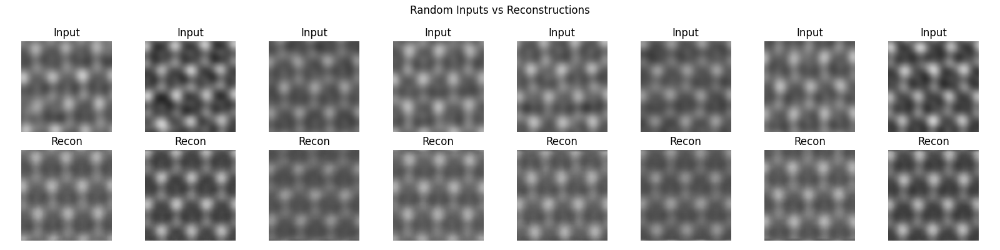

In [6]:
# Visualization 1: Input vs Reconstruction grid
def show_recon_grid(dataset, model, n=8, seed=0):
    rng = np.random.default_rng(seed)
    idxs = rng.choice(len(dataset), size=n, replace=False)
    with torch.no_grad():
        x = torch.stack([dataset[i] for i in idxs], dim=0).to(device)
        recon, _, _ = model(x)
    x = x.cpu().numpy()
    recon = recon.cpu().numpy()

    fig = plt.figure(figsize=(2*n, 4))
    gs = GridSpec(2, n)
    for i in range(n):
        ax1 = fig.add_subplot(gs[0, i])
        ax1.imshow(x[i,0], cmap='gray', vmin=0, vmax=1)
        ax1.set_title('Input')
        ax1.axis('off')
        ax2 = fig.add_subplot(gs[1, i])
        ax2.imshow(recon[i,0], cmap='gray', vmin=0, vmax=1)
        ax2.set_title('Recon')
        ax2.axis('off')
    plt.suptitle('Random Inputs vs Reconstructions')
    plt.tight_layout()
    plt.show()

show_recon_grid(dataset, model, n=8, seed=1)

Selected anomaly threshold (98th percentile): 0.003744


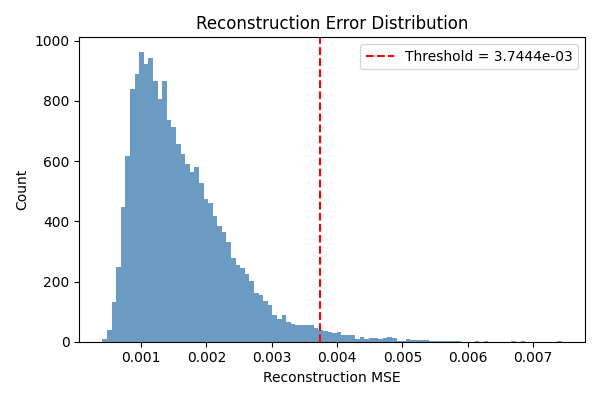

Anomalies: 377 / 18836 (2.00%)


In [7]:
# Visualization 2: Reconstruction error histogram and threshold selection
def select_threshold(errors, quantile=0.98):
    thr = float(np.quantile(errors, quantile))
    return thr

thr = select_threshold(rec_err, quantile=0.98)
print(f"Selected anomaly threshold (98th percentile): {thr:.6f}")

plt.figure(figsize=(6,4))
plt.hist(rec_err, bins=100, color='steelblue', alpha=0.8)
plt.axvline(thr, color='red', linestyle='--', label=f'Threshold = {thr:.4e}')
plt.xlabel('Reconstruction MSE')
plt.ylabel('Count')
plt.title('Reconstruction Error Distribution')
plt.legend()
plt.tight_layout()
plt.show()

anomaly_mask = rec_err >= thr
print(f"Anomalies: {anomaly_mask.sum()} / {len(rec_err)} ({100*anomaly_mask.mean():.2f}%)")

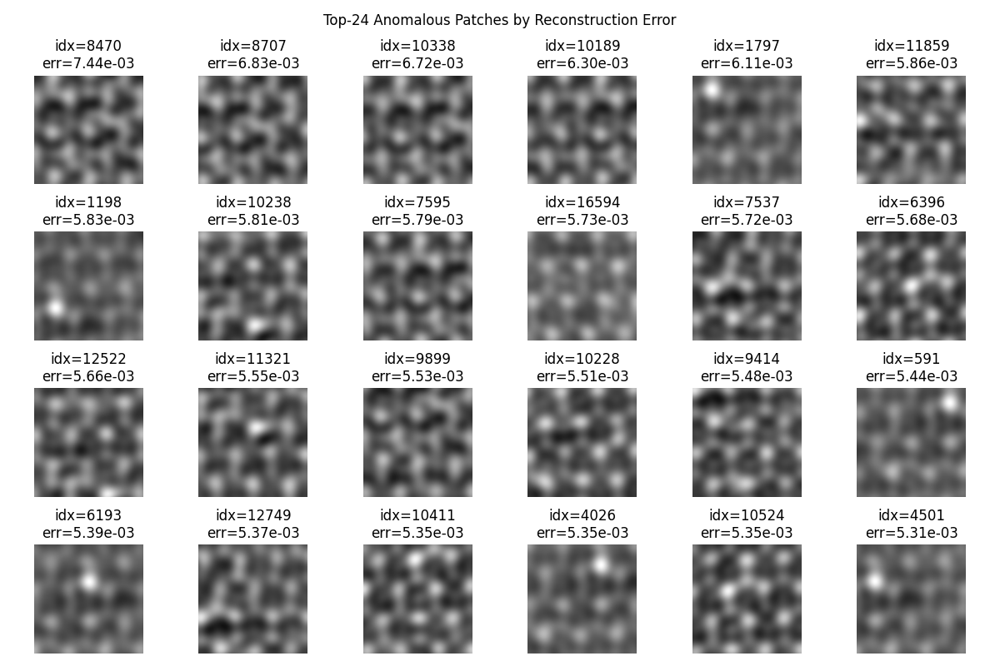

In [8]:
# Visualization 3: Top-K anomalous patches
def show_topk_anomalies(dataset, errors, k=24):
    k = int(min(k, len(errors)))
    top_idx = np.argsort(errors)[-k:][::-1]
    ncols = 6
    nrows = math.ceil(k / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(2*ncols, 2*nrows))
    axes = axes.ravel()
    for i, idx in enumerate(top_idx):
        img = dataset[idx][0].numpy()
        ax = axes[i]
        ax.imshow(img, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f"idx={idx}\nerr={errors[idx]:.2e}")
        ax.axis('off')
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    plt.suptitle(f'Top-{k} Anomalous Patches by Reconstruction Error')
    plt.tight_layout()
    plt.show()

show_topk_anomalies(dataset, rec_err, k=24)

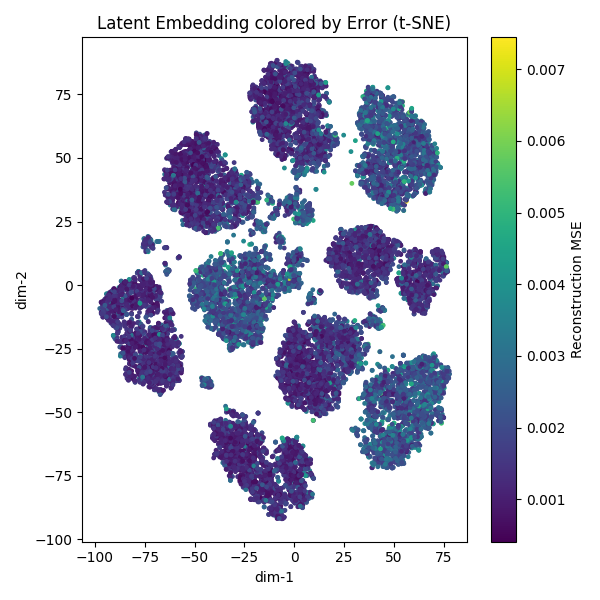

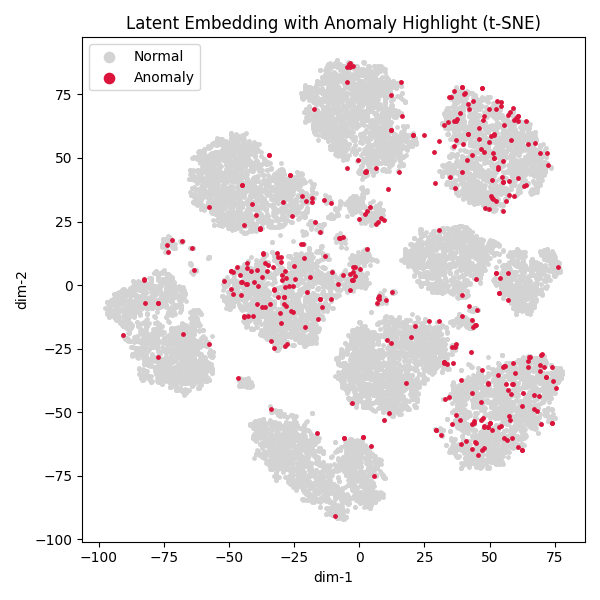

In [9]:
# Visualization 4: Latent space embedding colored by reconstruction error
def embed_latents(latent, errors, method='auto', seed=42):
    # Try t-SNE if sklearn is available, else PCA fallback
    rng = np.random.RandomState(seed)
    emb = None
    if method in ('auto', 'tsne'):
        try:
            from sklearn.manifold import TSNE
            emb = TSNE(n_components=2, random_state=rng, init='random', perplexity=30).fit_transform(latent)
            used = 't-SNE'
        except Exception:
            emb = None
    if emb is None:
        # PCA fallback
        x = latent - latent.mean(axis=0, keepdims=True)
        U, S, Vt = np.linalg.svd(x, full_matrices=False)
        emb = (U[:, :2] * S[:2])
        used = 'PCA'
    return emb, used

emb, used = embed_latents(mu, rec_err, method='auto')
plt.figure(figsize=(6,6))
plt.scatter(emb[:,0], emb[:,1], c=rec_err, s=6, cmap='viridis')
plt.colorbar(label='Reconstruction MSE')
plt.title(f'Latent Embedding colored by Error ({used})')
plt.xlabel('dim-1')
plt.ylabel('dim-2')
plt.tight_layout()
plt.show()

# Binary anomaly view
plt.figure(figsize=(6,6))
plt.scatter(emb[~anomaly_mask,0], emb[~anomaly_mask,1], c='lightgray', s=6, label='Normal')
plt.scatter(emb[anomaly_mask,0], emb[anomaly_mask,1], c='crimson', s=6, label='Anomaly')
plt.legend(markerscale=3)
plt.title(f'Latent Embedding with Anomaly Highlight ({used})')
plt.xlabel('dim-1')
plt.ylabel('dim-2')
plt.tight_layout()
plt.show()

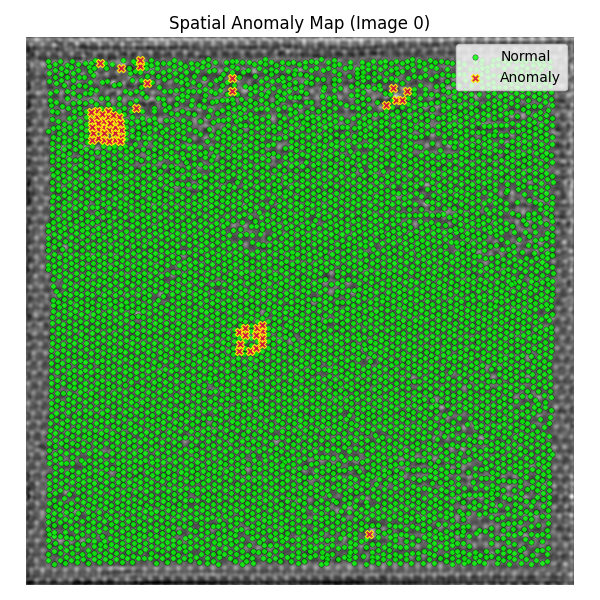

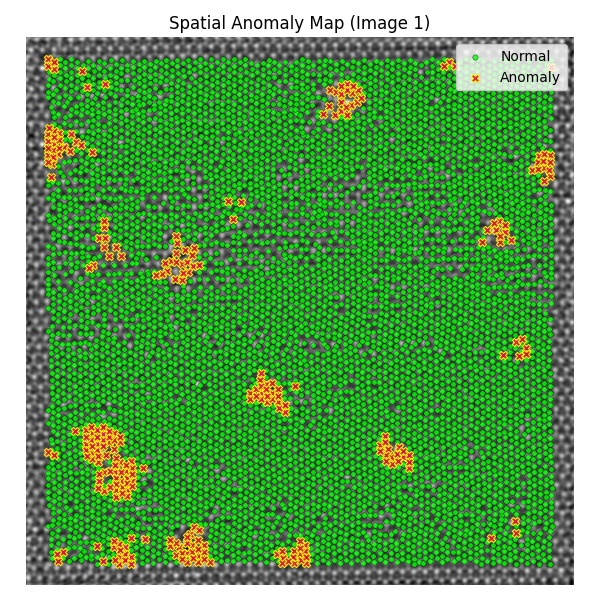

In [10]:
# Visualization 5: Spatial anomaly map overlaid on original images
# We map global dataset indices back to (image idx, local coord idx) using idx_map built above.
def plot_spatial_anomalies(image_idx=0):
    assert 0 <= image_idx < len(dataset.images)
    img = dataset.images[image_idx]
    coords = dataset.sample_coords[image_idx]

    # Find dataset indices belonging to this image
    indices_this_img = [i for i,(im,_) in enumerate(idx_map) if im == image_idx]
    if len(indices_this_img) == 0:
        print(f"No samples for image {image_idx}")
        return

    # Build a mask per local coord for anomaly
    local_mask = np.zeros(len(coords), dtype=bool)
    for dataset_idx in indices_this_img:
        im, local = idx_map[dataset_idx]
        if local < len(coords):
            local_mask[local] = anomaly_mask[dataset_idx]

    plt.figure(figsize=(6,6))
    plt.imshow(img, cmap='gray')
    if len(coords) > 0:
        # Normal points
        norm_pts = coords[~local_mask]
        if len(norm_pts) > 0:
            plt.scatter(norm_pts[:,1], norm_pts[:,0], s=15, c='lime', edgecolors='black', linewidths=0.3, alpha=0.8, label='Normal')
        # Anomaly points
        ano_pts = coords[local_mask]
        if len(ano_pts) > 0:
            plt.scatter(ano_pts[:,1], ano_pts[:,0], s=35, c='crimson', marker='X', edgecolors='yellow', linewidths=0.8, alpha=0.9, label='Anomaly')
    plt.title(f'Spatial Anomaly Map (Image {image_idx})')
    plt.axis('off')
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

# Plot for first 1-2 images (if present)
plot_spatial_anomalies(0)
if len(dataset.images) > 1:
    plot_spatial_anomalies(1)

## Notes
- Anomaly threshold uses a simple high-quantile on reconstruction error; tune the quantile (e.g., 0.95–0.995) to control sensitivity.
- Top-K anomalies are often vacancies or rare configurations; visually verify patterns.
- Latent clustering should reflect structural types; color by error to spot defect regions.
- For rotation-invariant analysis, switch to the rVAE once trained and repeat these plots.

KL threshold (98th percentile): 19.167572


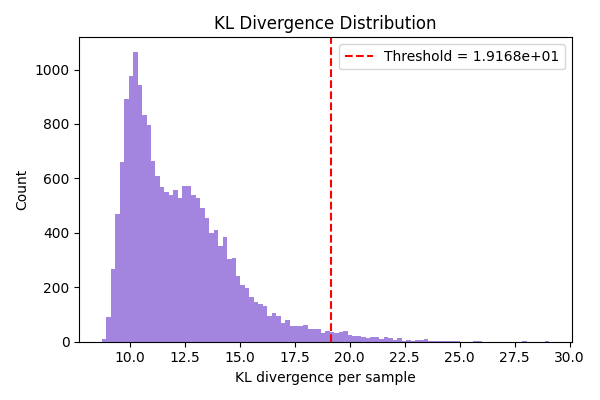

KL anomalies: 377 / 18836 (2.00%)


In [11]:
# KL-based anomaly scoring: per-sample KL(q(z|x) || p(z)) and thresholding
# KL for diagonal Gaussian posterior vs N(0, I): 0.5 * sum(exp(logvar) + mu^2 - 1 - logvar)
kl = 0.5 * np.sum(np.exp(logvar) + mu**2 - 1.0 - logvar, axis=1)

# Select high-quantile threshold (tune between 0.95–0.995)
kl_thr = float(np.quantile(kl, 0.98))
print(f"KL threshold (98th percentile): {kl_thr:.6f}")

plt.figure(figsize=(6,4))
plt.hist(kl, bins=100, color='mediumpurple', alpha=0.85)
plt.axvline(kl_thr, color='red', linestyle='--', label=f'Threshold = {kl_thr:.4e}')
plt.xlabel('KL divergence per sample')
plt.ylabel('Count')
plt.title('KL Divergence Distribution')
plt.legend()
plt.tight_layout()
plt.show()

anomaly_mask_kl = kl >= kl_thr
print(f"KL anomalies: {anomaly_mask_kl.sum()} / {len(kl)} ({100*anomaly_mask_kl.mean():.2f}%)")

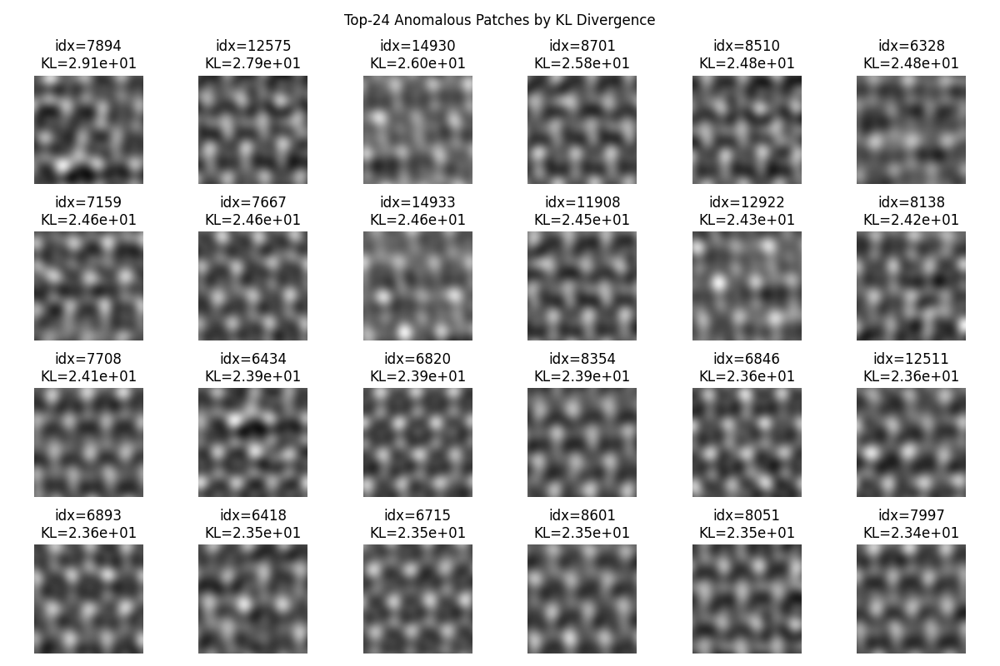

In [12]:
# Top-K anomalies by KL divergence

def show_topk_kl(dataset, kl_values, k=24):
    k = int(min(k, len(kl_values)))
    top_idx = np.argsort(kl_values)[-k:][::-1]
    ncols = 6
    nrows = math.ceil(k / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(2*ncols, 2*nrows))
    axes = axes.ravel()
    for i, idx in enumerate(top_idx):
        img = dataset[idx][0].numpy()
        ax = axes[i]
        ax.imshow(img, cmap='gray', vmin=0, vmax=1)
        ax.set_title(f"idx={idx}\nKL={kl_values[idx]:.2e}")
        ax.axis('off')
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    plt.suptitle(f'Top-{k} Anomalous Patches by KL Divergence')
    plt.tight_layout()
    plt.show()

show_topk_kl(dataset, kl, k=24)

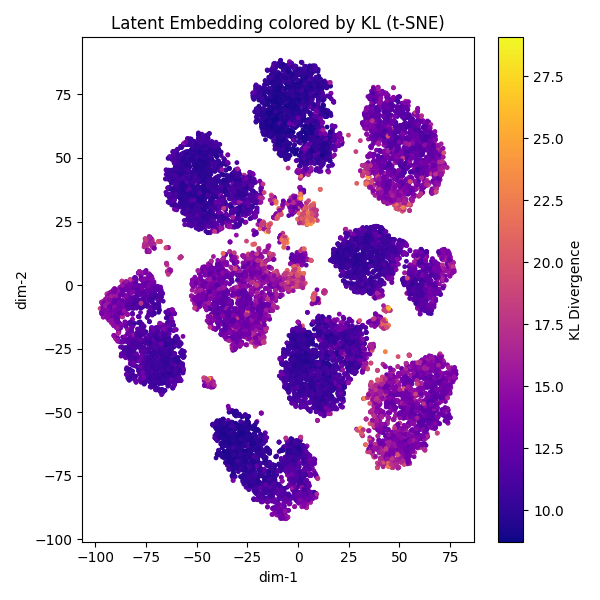

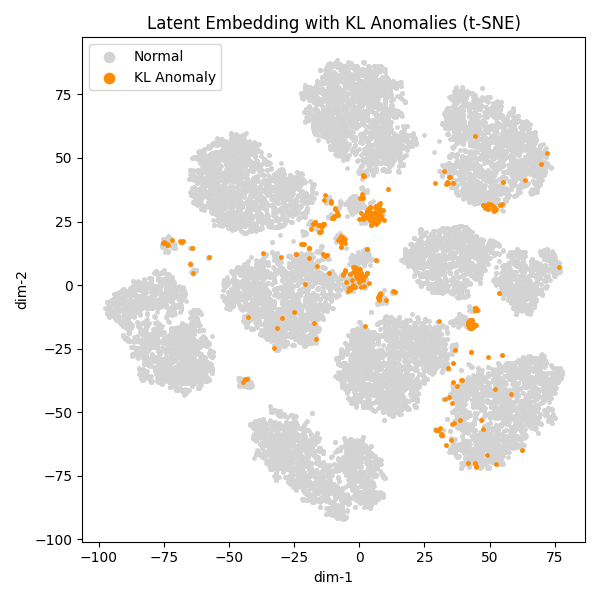

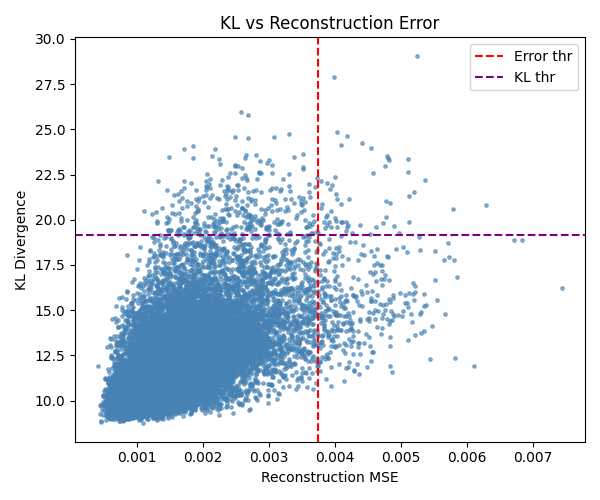

In [13]:
# Latent embedding colored by KL divergence; plus KL-vs-Error scatter
emb_kl, used_kl = embed_latents(mu, kl, method='auto')

plt.figure(figsize=(6,6))
plt.scatter(emb_kl[:,0], emb_kl[:,1], c=kl, s=6, cmap='plasma')
plt.colorbar(label='KL Divergence')
plt.title(f'Latent Embedding colored by KL ({used_kl})')
plt.xlabel('dim-1')
plt.ylabel('dim-2')
plt.tight_layout()
plt.show()

# Binary KL anomaly overlay
plt.figure(figsize=(6,6))
plt.scatter(emb_kl[~anomaly_mask_kl,0], emb_kl[~anomaly_mask_kl,1], c='lightgray', s=6, label='Normal')
plt.scatter(emb_kl[anomaly_mask_kl,0], emb_kl[anomaly_mask_kl,1], c='darkorange', s=6, label='KL Anomaly')
plt.legend(markerscale=3)
plt.title(f'Latent Embedding with KL Anomalies ({used_kl})')
plt.xlabel('dim-1')
plt.ylabel('dim-2')
plt.tight_layout()
plt.show()

# Joint view: KL vs Reconstruction Error
plt.figure(figsize=(6,5))
plt.scatter(rec_err, kl, s=6, c='steelblue', alpha=0.6)
plt.axvline(thr, color='red', linestyle='--', label='Error thr')
plt.axhline(kl_thr, color='purple', linestyle='--', label='KL thr')
plt.xlabel('Reconstruction MSE')
plt.ylabel('KL Divergence')
plt.title('KL vs Reconstruction Error')
plt.legend()
plt.tight_layout()
plt.show()

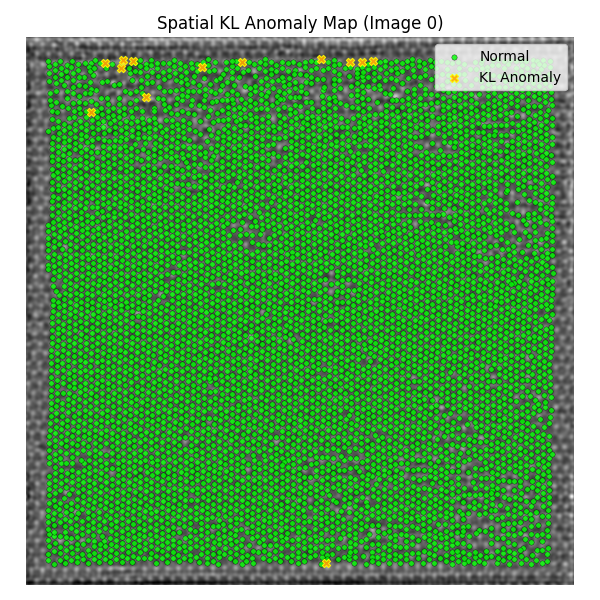

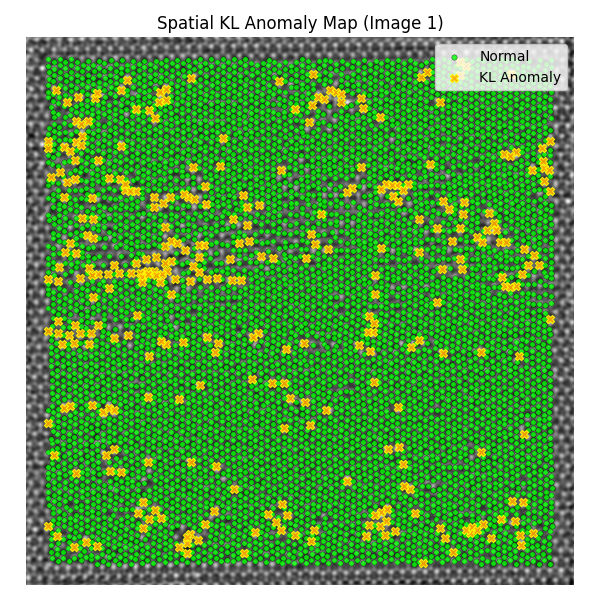

In [28]:
# Spatial anomaly overlay using KL anomalies

def plot_spatial_anomalies_kl(image_idx=0):
    assert 0 <= image_idx < len(dataset.images)
    img = dataset.images[image_idx]
    coords = dataset.sample_coords[image_idx]

    indices_this_img = [i for i,(im,_) in enumerate(idx_map) if im == image_idx]
    if len(indices_this_img) == 0:
        print(f"No samples for image {image_idx}")
        return

    local_mask = np.zeros(len(coords), dtype=bool)
    for dataset_idx in indices_this_img:
        im, local = idx_map[dataset_idx]
        if local < len(coords):
            local_mask[local] = anomaly_mask_kl[dataset_idx]

    plt.figure(figsize=(6,6))
    plt.imshow(img, cmap='gray')
    if len(coords) > 0:
        norm_pts = coords[~local_mask]
        if len(norm_pts) > 0:
            plt.scatter(norm_pts[:,1], norm_pts[:,0], s=15, c='lime', edgecolors='black', linewidths=0.3, alpha=0.8, label='Normal')
        ano_pts = coords[local_mask]
        if len(ano_pts) > 0:
            plt.scatter(ano_pts[:,1], ano_pts[:,0], s=35, c='orange', marker='X', edgecolors='yellow', linewidths=0.8, alpha=0.9, label='KL Anomaly')
    plt.title(f'Spatial KL Anomaly Map (Image {image_idx})')
    plt.axis('off')
    plt.legend(loc='upper right')
    plt.tight_layout()
    plt.show()

plot_spatial_anomalies_kl(0)
if len(dataset.images) > 1:
    plot_spatial_anomalies_kl(1)

In [29]:
# ROI utilities: select a local region and map to dataset indices

import numpy as np
import matplotlib.pyplot as plt

# Build cumulative lengths to map (image_idx, local_idx) <-> global idx
_cum_lens = np.cumsum([0] + [len(c) for c in dataset.sample_coords])


def region_by_pixels(image_idx: int, y0: int, y1: int, x0: int, x1: int):
    """Return global dataset indices that fall within [y0:y1, x0:x1] for a given image.
    Also returns the coords in that region.
    """
    coords = dataset.sample_coords[image_idx]
    mask = (coords[:,0] >= y0) & (coords[:,0] < y1) & (coords[:,1] >= x0) & (coords[:,1] < x1)
    local_idx = np.where(mask)[0]
    global_idx = _cum_lens[image_idx] + local_idx
    return global_idx.astype(int), coords[mask]


def region_by_fraction(image_idx: int, y_frac=(0.25, 0.75), x_frac=(0.25, 0.75)):
    """Select region using fractional extents of image height/width."""
    img = dataset.images[image_idx]
    H, W = img.shape
    y0, y1 = int(H * y_frac[0]), int(H * y_frac[1])
    x0, x1 = int(W * x_frac[0]), int(W * x_frac[1])
    return (y0, y1, x0, x1)


def show_region_box(image_idx: int, y0: int, y1: int, x0: int, x1: int, title='ROI'):
    img = dataset.images[image_idx]
    plt.figure(figsize=(6,6))
    plt.imshow(img, cmap='gray')
    # rectangle
    xs = [x0, x1, x1, x0, x0]
    ys = [y0, y0, y1, y1, y0]
    plt.plot(xs, ys, color='yellow', linewidth=2)
    plt.title(f'{title}: image {image_idx} [{y0}:{y1}, {x0}:{x1}]')
    plt.axis('off')
    plt.tight_layout()
    plt.show()


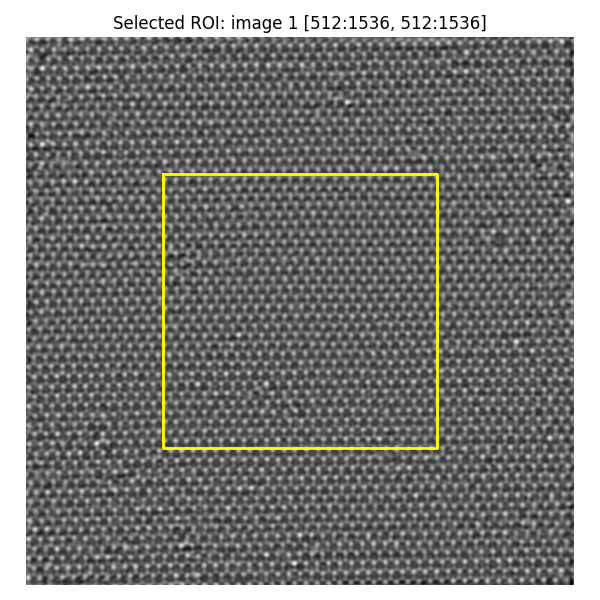

ROI contains 1839 sample sites.


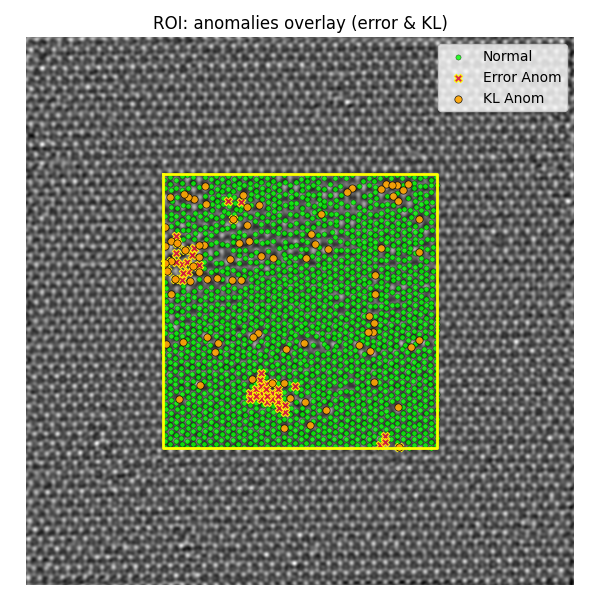

In [30]:
# Region analysis: pick an ROI and visualize anomalies locally

# Example ROI: center quarter of image 0 (adjust as needed)
image_idx = 1
y0, y1, x0, x1 = region_by_fraction(image_idx, y_frac=(0.25, 0.75), x_frac=(0.25, 0.75))
show_region_box(image_idx, y0, y1, x0, x1, title='Selected ROI')

region_indices, region_coords = region_by_pixels(image_idx, y0, y1, x0, x1)
print(f"ROI contains {len(region_indices)} sample sites.")

# Region spatial overlays for reconstruction-error anomalies and KL anomalies

def plot_region_anomalies(image_idx, y0, y1, x0, x1, indices, coords):
    plt.figure(figsize=(6,6))
    plt.imshow(dataset.images[image_idx], cmap='gray')
    xs = [x0, x1, x1, x0, x0]
    ys = [y0, y0, y1, y1, y0]
    plt.plot(xs, ys, color='yellow', linewidth=2)

    # Build local masks
    local_mask_err = np.zeros(len(coords), dtype=bool)
    local_mask_kl = np.zeros(len(coords), dtype=bool)
    # Map region indices to anomaly masks
    for j, gidx in enumerate(indices):
        local_mask_err[j] = anomaly_mask[gidx]
        local_mask_kl[j] = anomaly_mask_kl[gidx]

    # Plot normals in region
    norm_pts = coords[~local_mask_err & ~local_mask_kl]
    if len(norm_pts) > 0:
        plt.scatter(norm_pts[:,1], norm_pts[:,0], s=14, c='lime', edgecolors='black', linewidths=0.3, alpha=0.8, label='Normal')

    # Error anomalies
    err_pts = coords[local_mask_err]
    if len(err_pts) > 0:
        plt.scatter(err_pts[:,1], err_pts[:,0], s=36, c='crimson', marker='X', edgecolors='yellow', linewidths=0.8, alpha=0.9, label='Error Anom')

    # KL anomalies
    kl_pts = coords[local_mask_kl]
    if len(kl_pts) > 0:
        plt.scatter(kl_pts[:,1], kl_pts[:,0], s=28, c='orange', marker='o', edgecolors='black', linewidths=0.5, alpha=0.9, label='KL Anom')

    plt.legend(loc='upper right')
    plt.title('ROI: anomalies overlay (error & KL)')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

plot_region_anomalies(image_idx, y0, y1, x0, x1, region_indices, region_coords)

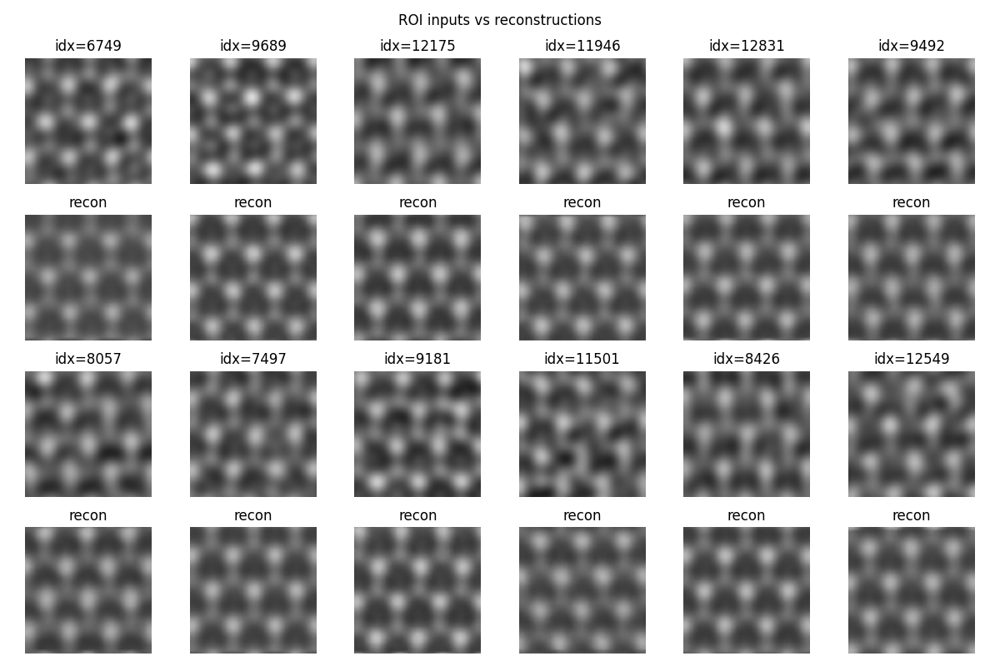

In [31]:
# ROI recon grid: visualize inputs and reconstructions within the region

def show_region_recon_grid(region_indices, n=12, seed=0):
    if len(region_indices) == 0:
        print('ROI has no samples.')
        return
    rng = np.random.default_rng(seed)
    sel = region_indices[rng.choice(len(region_indices), size=min(n, len(region_indices)), replace=False)]
    with torch.no_grad():
        x = torch.stack([dataset[i] for i in sel], dim=0).to(device)
        recon, _, _ = model(x)
    x = x.cpu().numpy()
    recon = recon.cpu().numpy()

    ncols = 6
    nrows = int(np.ceil(len(sel)/ncols)) * 2
    fig, axes = plt.subplots(nrows, ncols, figsize=(2*ncols, 2*nrows))
    axes = axes.ravel()
    for j, idx in enumerate(sel):
        r = j // ncols
        c = j % ncols
        ax_in = axes[r*2*ncols + c]
        ax_in.imshow(x[j,0], cmap='gray', vmin=0, vmax=1)
        ax_in.set_title(f'idx={idx}')
        ax_in.axis('off')
        ax_rec = axes[(r*2+1)*ncols + c]
        ax_rec.imshow(recon[j,0], cmap='gray', vmin=0, vmax=1)
        ax_rec.set_title('recon')
        ax_rec.axis('off')
    # turn off any extra axes
    # for k in range(2*ncols*nrows):
        # if k >= 2*len(sel):
            # axes[k].axis('off')
    plt.suptitle('ROI inputs vs reconstructions')
    plt.tight_layout()
    plt.show()

show_region_recon_grid(region_indices, n=12, seed=1)

ROI thresholds: error=0.0039033638313412666, KL=20.5345401763916


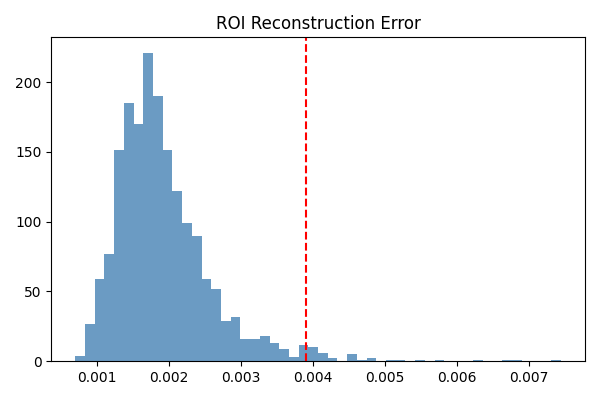

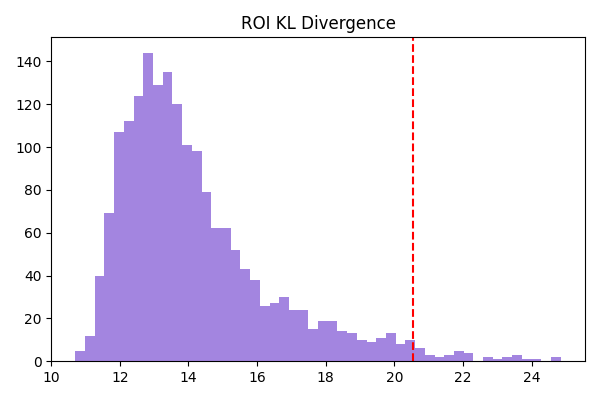

In [32]:
# ROI histograms and thresholds (local tuning)

roi_rec_err = rec_err[region_indices]
roi_kl = kl[region_indices]

roi_thr_err = float(np.quantile(roi_rec_err, 0.98)) if len(roi_rec_err) else None
roi_thr_kl = float(np.quantile(roi_kl, 0.98)) if len(roi_kl) else None
print(f"ROI thresholds: error={roi_thr_err}, KL={roi_thr_kl}")

if len(roi_rec_err):
    plt.figure(figsize=(6,4))
    plt.hist(roi_rec_err, bins=50, color='steelblue', alpha=0.8)
    if roi_thr_err is not None:
        plt.axvline(roi_thr_err, color='red', linestyle='--', label=f'err thr {roi_thr_err:.2e}')
    plt.title('ROI Reconstruction Error')
    plt.tight_layout()
    plt.show()

if len(roi_kl):
    plt.figure(figsize=(6,4))
    plt.hist(roi_kl, bins=50, color='mediumpurple', alpha=0.85)
    if roi_thr_kl is not None:
        plt.axvline(roi_thr_kl, color='red', linestyle='--', label=f'KL thr {roi_thr_kl:.2e}')
    plt.title('ROI KL Divergence')
    plt.tight_layout()
    plt.show()

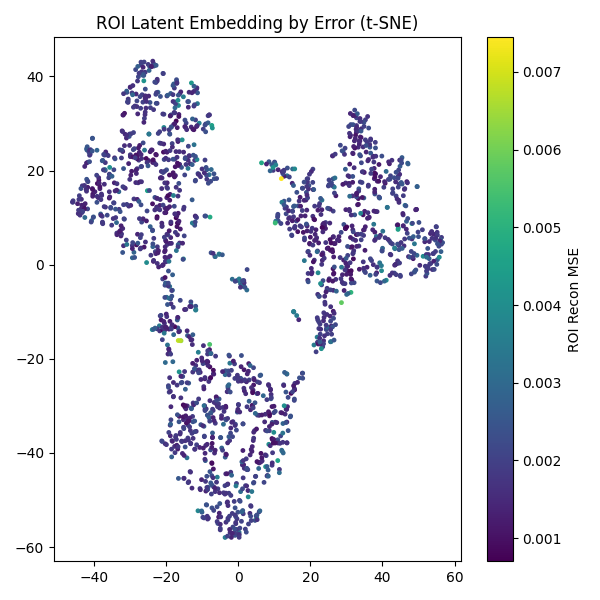

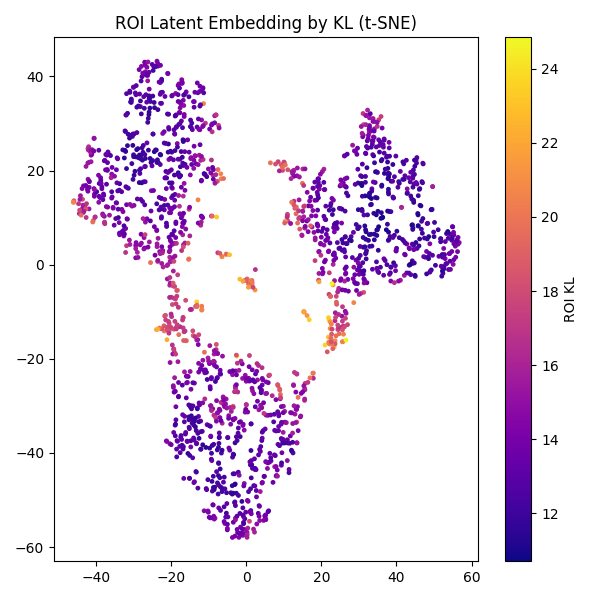

In [33]:
# ROI embedding: t-SNE/PCA on ROI mu colored by error and KL

roi_mu = mu[region_indices]
emb_roi, used_roi = embed_latents(roi_mu, roi_rec_err if len(region_indices) else np.array([]), method='auto') if len(region_indices) else (None, 'N/A')

if emb_roi is not None:
    plt.figure(figsize=(6,6))
    plt.scatter(emb_roi[:,0], emb_roi[:,1], c=roi_rec_err, s=6, cmap='viridis')
    plt.colorbar(label='ROI Recon MSE')
    plt.title(f'ROI Latent Embedding by Error ({used_roi})')
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(6,6))
    plt.scatter(emb_roi[:,0], emb_roi[:,1], c=roi_kl, s=6, cmap='plasma')
    plt.colorbar(label='ROI KL')
    plt.title(f'ROI Latent Embedding by KL ({used_roi})')
    plt.tight_layout()
    plt.show()
else:
    print('ROI has no samples to embed.')

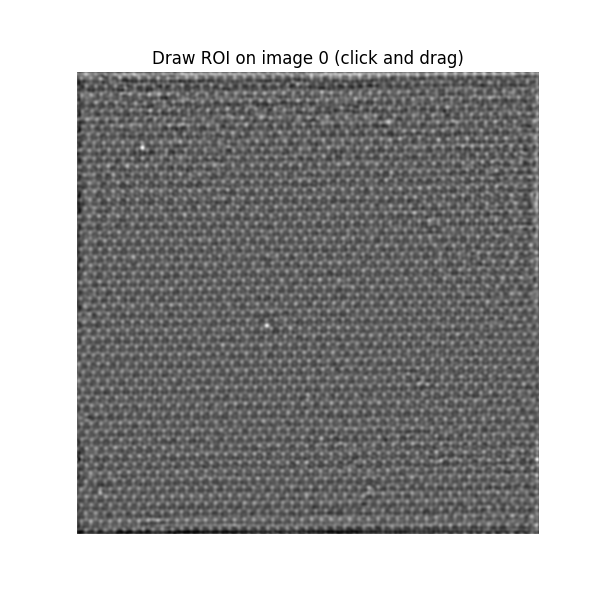

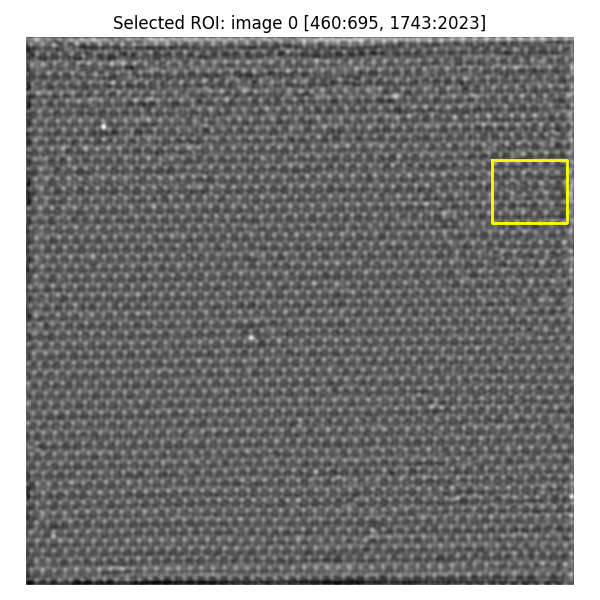

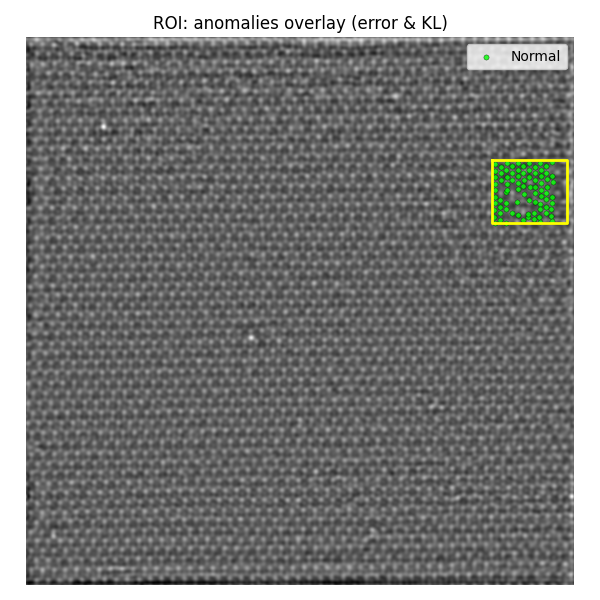

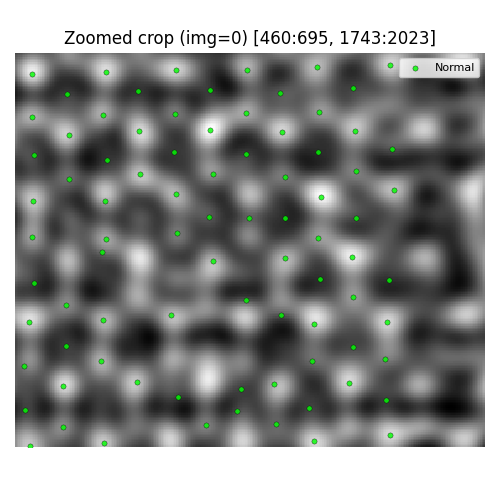

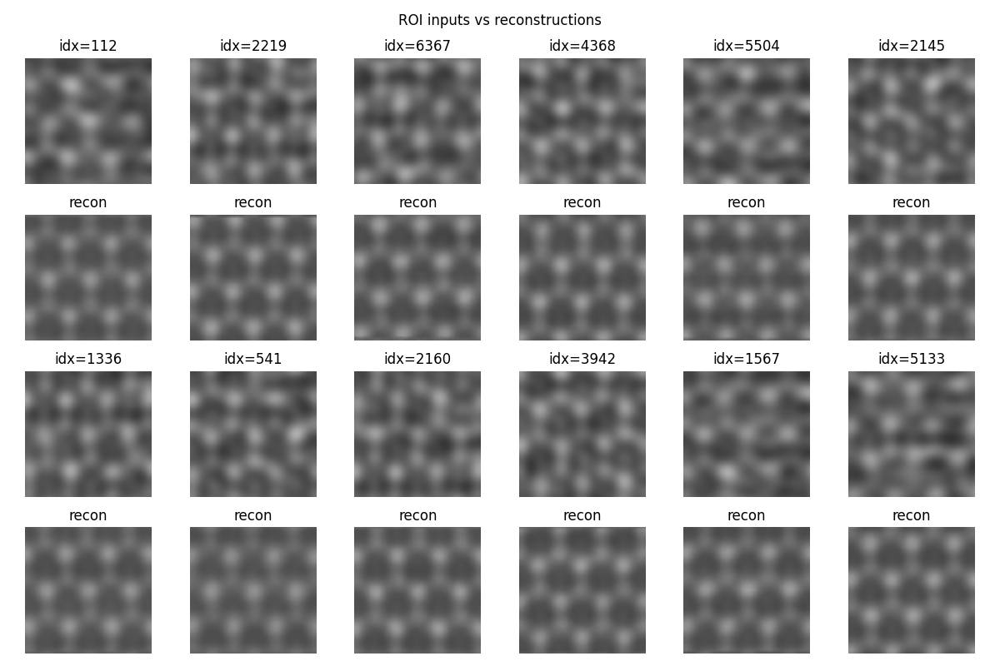

In [39]:
# Interactive ROI picker: drag to zoom and inspect defects
# - Draw a rectangle to define ROI
# - Automatically shows: ROI box, anomaly overlay, zoomed crop with markers, and ROI recon grid

from matplotlib.widgets import RectangleSelector

_current_roi = None  # (image_idx, y0, y1, x0, x1)


def show_zoom_crop(image_idx: int, y0: int, y1: int, x0: int, x1: int):
    img = dataset.images[image_idx]
    crop = img[y0:y1, x0:x1]

    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(crop, cmap='gray', interpolation='nearest')
    ax.set_title(f'Zoomed crop (img={image_idx}) [{y0}:{y1}, {x0}:{x1}]')
    ax.axis('off')

    # Overlay anomaly markers inside the zoomed crop
    try:
        region_indices, region_coords = region_by_pixels(image_idx, y0, y1, x0, x1)
        if len(region_indices) > 0:
            local_mask_err = anomaly_mask[region_indices]
            # KL mask may not be defined in some flows; fall back to zeros
            local_mask_kl = (
                anomaly_mask_kl[region_indices]
                if 'anomaly_mask_kl' in globals() and anomaly_mask_kl is not None
                else np.zeros_like(local_mask_err, dtype=bool)
            )
            normals = ~(local_mask_err | local_mask_kl)

            # Shift coords into crop frame
            if np.any(normals):
                pts = region_coords[normals]
                ax.scatter(
                    pts[:, 1] - x0,
                    pts[:, 0] - y0,
                    s=14,
                    c='lime',
                    edgecolors='black',
                    linewidths=0.3,
                    alpha=0.8,
                    label='Normal',
                )
            if np.any(local_mask_err):
                pts = region_coords[local_mask_err]
                ax.scatter(
                    pts[:, 1] - x0,
                    pts[:, 0] - y0,
                    s=36,
                    c='crimson',
                    marker='X',
                    edgecolors='yellow',
                    linewidths=0.8,
                    alpha=0.9,
                    label='Error Anom',
                )
            if np.any(local_mask_kl):
                pts = region_coords[local_mask_kl]
                ax.scatter(
                    pts[:, 1] - x0,
                    pts[:, 0] - y0,
                    s=28,
                    c='orange',
                    marker='o',
                    edgecolors='black',
                    linewidths=0.5,
                    alpha=0.9,
                    label='KL Anom',
                )
            ax.legend(loc='upper right', fontsize=8)
    except Exception as e:
        # If overlays fail for any reason, still show the crop
        print(f"Warning: could not overlay anomalies on crop: {e}")

    plt.tight_layout()
    plt.show()


def _onselect(eclick, erelease, image_idx: int, min_size: int, n_recon: int):
    global _current_roi
    if eclick.xdata is None or eclick.ydata is None or erelease.xdata is None or erelease.ydata is None:
        return
    x0, y0 = int(min(eclick.xdata, erelease.xdata)), int(min(eclick.ydata, erelease.ydata))
    x1, y1 = int(max(eclick.xdata, erelease.xdata)), int(max(eclick.ydata, erelease.ydata))
    # Enforce minimum size
    if (y1 - y0) < min_size or (x1 - x0) < min_size:
        print(f"ROI too small (<{min_size}px). Drag a larger box.")
        return

    _current_roi = (image_idx, y0, y1, x0, x1)
    show_region_box(image_idx, y0, y1, x0, x1, title='Selected ROI')

    region_indices, region_coords = region_by_pixels(image_idx, y0, y1, x0, x1)
    print(f"ROI contains {len(region_indices)} sample sites.")

    # Overlay anomalies inside ROI (error & KL)
    plot_region_anomalies(image_idx, y0, y1, x0, x1, region_indices, region_coords)

    # Show zoomed raw image crop with anomaly markers
    show_zoom_crop(image_idx, y0, y1, x0, x1)

    # Recon grid for ROI samples
    show_region_recon_grid(region_indices, n=n_recon, seed=1)


def interactive_roi_picker(image_idx: int = 0, min_size: int = 16, n_recon: int = 12):
    """
    Draw a rectangle on the chosen image to inspect a local region.
    - image_idx: which image to display for selection
    - min_size: minimum side length (pixels) to accept the selection
    - n_recon: number of ROI patches to show in the recon grid
    """
    assert 0 <= image_idx < len(dataset.images)
    fig, ax = plt.subplots(1, 1, figsize=(6, 6))
    ax.imshow(dataset.images[image_idx], cmap='gray')
    ax.set_title(f'Draw ROI on image {image_idx} (click and drag)')
    ax.axis('off')

    selector = RectangleSelector(
        ax,
        lambda eclick, erelease: _onselect(eclick, erelease, image_idx, min_size, n_recon),
        useblit=True,
        button=[1],  # left mouse button
        minspanx=2,
        minspany=2,
        spancoords='pixels',
        interactive=True,
        drag_from_anywhere=True,
    )
    plt.show()
    return selector

# Launch the interactive ROI picker on the first image by default
interactive_roi_picker(image_idx=0, min_size=16, n_recon=12)